**Table of contents**<a id='toc0_'></a>    
- [Import Library](#toc1_1_1_)    
    - [Read Dataset](#toc1_1_2_)    
      - [Load Dataset](#toc1_1_2_1_)    
    - [Exploratory Data Analytics](#toc1_1_3_)    
    - [Data Preparation](#toc1_1_4_)    
      - [Change Data Dtypes datetime](#toc1_1_4_1_)    
      - [Get Interaction counts](#toc1_1_4_2_)    
      - [Get Novelty Score](#toc1_1_4_3_)    
      - [Get Serependity Score](#toc1_1_4_4_)    
  - [Content-Based Recommendation](#toc1_2_)    
      - [Removing Special Characters](#toc1_2_1_1_)    
      - [Stemming Process](#toc1_2_1_2_)    
      - [Text Vectorization: TF-IDF](#toc1_2_1_3_)    
      - [Calculate Cosine Similarity](#toc1_2_1_4_)    
      - [Content Similar Recommendation](#toc1_2_1_5_)    
      - [**Novelty**](#toc1_2_1_6_)    
      - [Novelty Recommendation](#toc1_2_1_7_)    
      - [Serependity](#toc1_2_1_8_)    
      - [Serependity Recommendation](#toc1_2_1_9_)    
      - [NDCG Score](#toc1_2_1_10_)    
  - [Collaborative Filtering: KNN](#toc1_3_)    
    - [Item-to-Item Neighbor CF](#toc1_3_1_)    
      - [Model Training](#toc1_3_1_1_)    
      - [Hyperparameter Tuning KNN Model](#toc1_3_1_2_)    
      - [Model Performance](#toc1_3_1_3_)    
      - [Evaluate Best Model](#toc1_3_1_4_)    
    - [Predict](#toc1_3_2_)    
  - [CF: Factorization Machine Regressor](#toc1_4_)    
      - [Mapping Data](#toc1_4_1_1_)    
      - [Splitting Train Test Data](#toc1_4_1_2_)    
      - [Compressed Sparse Row Matrix](#toc1_4_1_3_)    
      - [FMRegressor Function](#toc1_4_1_4_)    
    - [Train Recommendation System](#toc1_4_2_)    
      - [Baseline Model](#toc1_4_2_1_)    
      - [FM Regressor](#toc1_4_2_2_)    
      - [myFM Regressor](#toc1_4_2_3_)    
    - [Best Model Comparison](#toc1_4_3_)    
      - [FM recommendation](#toc1_4_3_1_)    
  - [Implicit Feedback: Duration Play](#toc1_5_)    
      - [Alternating Least Squares](#toc1_5_1_1_)    
      - [Bayesian Personalized Ranking](#toc1_5_1_2_)    
      - [BPR Recommendation](#toc1_5_1_3_)    
      - [Price](#toc1_5_1_4_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

## <a id='toc1_1_1_'></a>[Import Library](#toc0_)

In [3]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import datetime as dt
import seaborn as sns
import plotly.express as px
import dask.dataframe as dd
import copy
import joblib


from scipy.linalg import norm
from myfm import MyFMRegressor, MyFMClassifier, RelationBlock
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder

import warnings
import math

warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)


### <a id='toc1_1_2_'></a>[Read Dataset](#toc0_)

In [4]:
# Joblib is used to load dataset to reduce computational time
games_data = joblib.load('dataset/dataset.pkl')

#### <a id='toc1_1_2_1_'></a>[Load Dataset](#toc0_)

In [2]:
def merge_data(left_data, right_data, how, left_on, right_on):
    concat_data = dd.merge(left_data, right_data, how=how, left_on=left_on, right_on=right_on)
    return concat_data

def load_dataset(path1, path2, path3, path4, joined, how):
    if path3 is None or path4 is None:
        data1 = pd.read_csv(path1)
        data2 = pd.read_csv(path2)

        data = merge_data(left_data=data1, right_data=data2, how=how, left_on=joined, right_on=joined)
    else:
        data1 = pd.read_csv(path1)
        data2 = pd.read_csv(path2)
        data3 = pd.read_csv(path3)
        data4 = pd.read_csv(path4)

        data1 = data1[['app_id', 'date', 'is_recommended', 'hours', 'user_id']]
        data2 = data2[['app_id', 'title', 'rating', 'price_final']]
        data3 = data3[['appid', 'name', 'developer', 'publisher', 'categories', 'genres']]
        data4 = data4[['name', 'release_date', 'popular_tags', 'game_details', 'game_description']]

        data = merge_data(left_data=data1, right_data=data2, how=how, left_on=joined, right_on=joined)
        print(f'Original data shape: {data1.shape}')
        print(f'data shape merge-1: {data.shape}')

        data = merge_data(left_data=data, right_data=data3, how='inner', left_on=joined, right_on='appid')
        print(f'data shape merge-2: {data.shape}')
        
        data = merge_data(left_data=data, right_data=data4, how='left', left_on='title', right_on='name')
        print(f'data shape merge-3: {data.shape}')

    return data  # Compute the Dask DataFrame to obtain a Pandas DataFrame


In [3]:
path1 = 'dataset/recommendations.csv'
path2 = 'dataset/games.csv'
path3 = 'dataset/steam.csv'
path4 = 'dataset/steam_games.csv'

games_data = load_dataset(path1=path1, path2=path2, path3=path3, path4=path4,
                          joined='app_id',
                          how='inner')

Original data shape: (37839599, 5)
data shape merge-1: (37839599, 8)
data shape merge-2: (25994216, 14)
data shape merge-3: (26025787, 19)


#### Dump dataset

In [4]:
joblib.dump(games_data, 'dataset/dataset.pkl')

['dataset/dataset.pkl']

In [31]:
games_data.head(2)

,app_id,date,is_recommended,hours,user_id,title,rating,price_final,appid,name_x,developer,publisher,categories,genres,name_y,release_date,popular_tags,game_details,game_description
8106817,268910,2017-11-22,True,13.3,1338200,Cuphead,Overwhelmingly Positive,19.99,268910,Cuphead,Studio MDHR Entertainment Inc.,Studio MDHR Entertainment Inc.,Single-player;Local Co-op;Shared/Split Screen;...,Action;Indie,Cuphead,"Sep 29, 2017","Difficult,Cartoon,Great Soundtrack,Platformer,...","Single-player,Local Co-op,Shared/Split Screen,...",About This Game Cuphead is a classic run and ...
13278080,427100,2020-05-06,False,0.8,9956743,Fernbus Simulator,Mostly Positive,20.99,427100,Fernbus Simulator,TML-Studios,Aerosoft GmbH,Single-player;Steam Achievements;Steam Worksho...,Simulation,Fernbus Simulator,"Aug 25, 2016","Simulation,Driving,Realistic,Singleplayer,Open...","Single-player,Steam Achievements,Steam Worksho...",About This Game The Fernbus Coach Simulator i...


In [32]:
games_data.shape

(1000000, 19)

In [5]:
# We reduce our data as 1000_000 due to computational cost and time 
games_data, games_data_2 = train_test_split(games_data, train_size=1000_000, test_size=None, random_state=42)

## <a id='toc1_1_3_'></a>[Exploratory Data Analytics](#toc0_)

In [6]:
## Convert rating information into scale
def rating_mapping(row):

    rating = row['rating']
    
    if rating == 'Overwhelmingly Positive':
        return 9
    elif rating == 'Very Positive':
        return 8
    elif rating == 'Mostly Positive':
        return 7
    elif rating == 'Positive':
        return 6
    elif rating == 'Mixed':
        return 5
    elif rating == 'Negative':
        return 4
    elif rating == 'Mostly Negative':
        return 3
    elif rating == 'Very Negative':
        return 2
    elif rating == 'Overwhelmingly Negative':
        return 1

In [7]:
# Explore Explicit Data Target 'Rating'
rating_data = games_data.groupby('rating')[['app_id']].count().reset_index()

rating_data['new_rating'] = rating_data.apply(rating_mapping, axis=1)

rating_data.sort_values(by='new_rating', ascending=False)[['rating','app_id']].rename(columns={'app_id':'count'}).reset_index(drop=True)

,rating,count
0,Overwhelmingly Positive,262271
1,Very Positive,574438
2,Mostly Positive,102318
3,Positive,1990
4,Mixed,55867
5,Negative,128
6,Mostly Negative,2705
7,Very Negative,92
8,Overwhelmingly Negative,191


In [8]:
# Update layout with custom category order
category_order = ['Overwhelmingly Positive', 'Mostly Positive', 'Very Positive', 'Positive',
                'Mixed', 'Negative', 'Very Negative', 'Mostly Negative', 'Overwhelmingly Negative']

# Define custom colors for each category
colors = px.colors.diverging.RdYlGn_r

# Update layout with custom category order
fig = px.histogram(rating_data, 
             x='rating', 
             y='app_id',
             color='rating',
             color_discrete_sequence=colors)


fig.update_layout(xaxis={'categoryorder':'array', 
                         'categoryarray': category_order})

# Define custom colors for each category
fig.update_traces(texttemplate='%{y}', textposition='outside')

# Show the plot
fig.show()

In [9]:
# Define custom colors for each category
colors = px.colors.diverging.RdYlGn_r

# Update layout with custom category order
fig = px.bar(games_data.groupby('title')[['app_id']].count().reset_index().sort_values('app_id',ascending=False).head(10), 
             x='title', 
             y='app_id',
             color='title',
             text='app_id',
             color_discrete_sequence=colors)


# fig.update_layout(xaxis={'categoryorder':'array', 
#                          'categoryarray': category_order})

# Define custom colors for each category
fig.update_traces(texttemplate='%{text}', textposition='outside')

# Show the plot
fig.show()

In [10]:
# Define custom colors for each category
colors = px.colors.diverging.RdYlGn_r

# Update layout with custom category order
fig = px.bar(games_data.groupby('genres')[['app_id']].count().reset_index().sort_values('app_id',ascending=False).head(10), 
             x='genres', 
             y='app_id',
             color='genres',
             text='app_id',
             color_discrete_sequence=colors)


# fig.update_layout(xaxis={'categoryorder':'array', 
#                          'categoryarray': category_order})

# Define custom colors for each category
fig.update_traces(texttemplate='%{text}', textposition='outside')

# Show the plot
fig.show()

## <a id='toc1_1_4_'></a>[Data Preprocessing](#toc0_)
---------

In [11]:
# Create the function to get number of interactions per apps
def calculate_interactions_per_app(data):
    # Group the data by 'app_id' and count the number of unique users for each app_id.
    unique_data = data.drop_duplicates(subset=['user_id','app_id'], keep='first')
    interactions_count = unique_data.groupby('app_id')['user_id'].count().reset_index()

    # Rename the count column for clarity.
    interactions_count = interactions_count.rename(columns={'user_id': 'interactions_count'})

    # Add interaction data into games_data
    data = data.merge(interactions_count, how='inner', left_on='app_id', right_on='app_id')

    return data

def calculate_unexpectedness_score(app_data):
    # Example: Calculate unexpectedness based on interaction count (lower count => higher unexpectedness).
    # You may need to adjust this based on your dataset and unexpectedness criteria.
    max_interaction_count = app_data['interactions_count'].max()
    min_interaction_count = app_data['interactions_count'].min()

    app_data['unexpectedness_score'] = max_interaction_count - app_data['interactions_count']
    app_data['popularity_score'] = (( (app_data['interactions_count'] - min_interaction_count) / (max_interaction_count - min_interaction_count) ) \
                                    * 8 + 1 )
    
    return app_data

def calculate_novelty_based_on_rarity(app_data):
    # Assuming 'interaction_count' is a column in your dataset representing how often the app has been interacted with.
    # You may need to adjust the scaling factor as per your dataset.
    
    app_data['novelty_score'] = (app_data.user_id.nunique() - app_data['interactions_count']) / app_data.user_id.nunique()
    
    return app_data


#### <a id='toc1_1_4_1_'></a>[Change data dtypes datetime](#toc0_)

In [12]:
import datetime as dt

# Change reviewed date and release date dtypes into datetime
games_data = games_data.rename(columns={'date':'review_date'})
games_data['review_date'] = pd.to_datetime(games_data.review_date)
games_data['release_date'] = pd.to_datetime(games_data.release_date)

# convert the app_id and user_id dtype into object
games_data['app_id'] = games_data['app_id'].astype('str')
games_data['user_id'] = games_data['user_id'].astype('str')

current_date = pd.to_datetime('2020-01-01')

In [13]:
# Drop duplicate columns
games_data = games_data.drop(columns=['name_x','name_y'], axis=1)

In [14]:
# Create year feature to mentioned game release year
games_data['year'] = ((current_date - games_data['release_date']).dt.days ) / 365

#### <a id='toc1_1_4_2_'></a>[Get Interaction counts](#toc0_)

In [15]:
# Get the number of interactions per apps
games_data = calculate_interactions_per_app(games_data)
games_data.interactions_count = games_data.interactions_count.astype('int64')

#### <a id='toc1_1_4_3_'></a>[Get Novelty Score](#toc0_)

In [16]:
# Calculate novelty score
games_data = calculate_novelty_based_on_rarity(games_data)

In [17]:
# Apply to get the new rating scale from rating information
games_data['new_rating'] = games_data.apply(rating_mapping, axis=1)

In [18]:
# Calculate Relevance Score and Unexpectednes Score
games_data = calculate_unexpectedness_score(games_data)

#### <a id='toc1_1_4_4_'></a>[Get Serependity Score](#toc0_)

In [19]:
games_data['serependity_score'] = games_data['popularity_score'] / games_data['new_rating'] 

#### Remapping is_recommended feature into binary

In [20]:
games_data['is_recommended'] = games_data.is_recommended.map({True:1, False:0})

#### Get game's price range 

In [21]:
# Create categorizing price function
def price_category(row):
    
    price = row['price_final']

    if (price >= 0) & (price < 7.5):
        return 'cheap'
    elif (price >= 7.5) & (price <= 22.5):
        return 'medium'
    elif (price > 22.5) & (price <= 33):
        return 'expensive'
    elif (price > 33) & (price <= 53):
        return 'luxury'
    elif price > 53:
        return 'overpriced'

# Get the category of price
games_data['price_range'] = games_data.apply(price_category, axis=1).astype('category')

In [22]:
# Define custom colors for each category
colors = px.colors.diverging.RdYlGn_r

fig = px.histogram(data_frame=games_data.groupby('price_range')[['app_id']].count().reset_index().sort_values('app_id',ascending=False),
                   x='price_range',
                   y='app_id',
                   color='price_range',
                   color_discrete_sequence=colors)

# Set the category order
fig.update_layout(xaxis={'categoryorder':'array', 
                         'categoryarray': ['cheap','medium','expensive','luxury','overpriced'] })

# Define custom colors for each category
fig.update_traces(texttemplate='%{y}', textposition='outside')

fig.show()

#### Get game's release date range

In [23]:
# Create categorizing price function
def trend_year(row):
    
    trend = row['year']

    if (trend >= 0) & (trend < 1):
        return 'newest'
    elif (trend >= 1) & (trend <= 3):
        return 'new'
    elif (trend > 3) & (trend <= 5):
        return 'mid'
    elif (trend > 5) & (trend <= 10):
        return 'old'
    elif trend > 10 or np.isnan(trend):
        return 'outdated'

# Get the category of price
games_data['year_range'] = games_data.apply(trend_year, axis=1).astype('category')

In [24]:
# Define custom colors for each category
colors = px.colors.diverging.RdYlGn_r

fig = px.histogram(data_frame=games_data,
                   x='year_range',
                   color='year_range',
                   color_discrete_sequence=colors)

fig.update_layout(xaxis={'categoryorder':'array', 
                         'categoryarray': ['newest','new','mid','old','outdated'] })

# Define custom colors for each category
fig.update_traces(texttemplate='%{y}', textposition='outside')

fig.show()

In [25]:
games_data.head(2)

,app_id,review_date,is_recommended,hours,user_id,title,rating,price_final,appid,developer,publisher,categories,genres,release_date,popular_tags,game_details,game_description,year,interactions_count,novelty_score,new_rating,unexpectedness_score,popularity_score,serependity_score,price_range,year_range
0,268910,2017-11-22,1,13.3,1338200,Cuphead,Overwhelmingly Positive,19.99,268910,Studio MDHR Entertainment Inc.,Studio MDHR Entertainment Inc.,Single-player;Local Co-op;Shared/Split Screen;...,Action;Indie,2017-09-29,"Difficult,Cartoon,Great Soundtrack,Platformer,...","Single-player,Local Co-op,Shared/Split Screen,...",About This Game Cuphead is a classic run and ...,2.257534,1813,0.997902,9,10555,2.172152,0.24135,medium,new
1,268910,2022-03-19,1,89.8,3473815,Cuphead,Overwhelmingly Positive,19.99,268910,Studio MDHR Entertainment Inc.,Studio MDHR Entertainment Inc.,Single-player;Local Co-op;Shared/Split Screen;...,Action;Indie,2017-09-29,"Difficult,Cartoon,Great Soundtrack,Platformer,...","Single-player,Local Co-op,Shared/Split Screen,...",About This Game Cuphead is a classic run and ...,2.257534,1813,0.997902,9,10555,2.172152,0.24135,medium,new


## <a id='toc1_2_'></a>[Content-Based Recommendation](#toc0_)
--------

In [83]:
# Create new dataframe for content based
data_content = games_data[['user_id', 'app_id', 'title', 'categories', 'genres', 'popular_tags', 'game_description',
                           'year_range','interactions_count','novelty_score', 'serependity_score']]

#### <a id='toc1_2_1_1_'></a>[1. Removing Special Characters](#toc0_)

In [84]:
# Removing special characters between word
def remove_symbols(data, column):
    
    # Create a new Series with the modified data
    data[column].fillna('', inplace=True)

    # Replace special character
    new_column = data[column].str.replace(' ',',')
    new_column = new_column.str.replace(',,',',')
    new_column = new_column.str.replace('_','')
    new_column = new_column.str.replace(':','')
    new_column = new_column.str.replace('(','')
    new_column = new_column.str.replace(')','')
    new_column = new_column.str.replace(';',',')
    new_column = new_column.str.replace('-',',')

    # Return the column
    return new_column

In [87]:
def get_tags(data):

    # Remove special characters
    data['new_title'] = remove_symbols(data,'title')
    data['new_categories'] = remove_symbols(data,'categories')
    data['new_genres'] = remove_symbols(data,'genres')
    data['new_popular_tags'] = remove_symbols(data,'popular_tags')
    data['new_game_description'] = remove_symbols(data,'game_description')

    # Create feature from combined all string information
    data['tags'] = data['new_title'] + ',' + data['new_categories'] + ',' + data['new_genres'] + ',' \
                    + data['new_popular_tags'] + ',' + data['new_game_description']
    
    data['tags'] = data['tags'].str.replace(',,',',')

    # Delete the new feature
    data = data.drop(columns=['new_title', 'new_categories', 'new_genres', 'new_popular_tags', 'new_game_description'], axis=1)


    return data


In [88]:
##--- Get data with no special character and tags column ---##
data_content = get_tags(data_content)

In [89]:
## Create dataframe for model training
new_data_content = data_content[['user_id','app_id','tags']]

# Remove duplicates app_id to get only unique feature of tags
new_data_content = data_content.drop_duplicates('app_id', keep='first',inplace=False)

# Convert user_id and app_id dtype into object type
new_data_content['user_id'] = new_data_content['user_id'].astype('str')
new_data_content['app_id'] = new_data_content['app_id'].astype('str')

In [90]:
# tokenize the tags information and lowerize the character
new_data_content['tags'] = new_data_content['tags'].str.replace(',',' ')
new_data_content['tags'] = new_data_content['tags'].apply(lambda x: x.lower() if isinstance(x, str) else np.nan)

In [91]:
## Append tags values of word length text
txt = []
for i in new_data_content.reset_index(drop=True).index:
    txt.append(len(new_data_content.tags.values[i]))

In [92]:
## Check for any NaN values on Tags feature
new_data_content.loc[new_data_content.tags.isna() == True]

,user_id,app_id,title,categories,genres,popular_tags,game_description,year_range,interactions_count,novelty_score,serependity_score,tags


#### <a id='toc1_2_1_2_'></a>[2. Stemming Process](#toc0_)

In [93]:
## Using SnowballStemmer to reducing computational cost
from nltk.stem import SnowballStemmer

ss = SnowballStemmer(language='english')

In [94]:
## defining the stemming function
def stem(text):
    y=[]
    
    ## Stemming for each word in text.
    for i in text.split():
        y.append(ss.stem(i))
    
    # Split each word by space
    return " ".join(y)

In [95]:
# applying stemming on the tags column
new_data_content['tags'] = new_data_content['tags'].apply(stem) 

#### <a id='toc1_2_1_3_'></a>[3. Text Vectorization: TF-IDF](#toc0_)

In [96]:
# Perform TF-IDF vectorization handling weight based on occurence word
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()

count_matrix = vectorizer.fit_transform(new_data_content['tags'])

In [97]:
# Dataset dimention after vectorized character
count_matrix.shape

(12412, 50429)

#### <a id='toc1_2_1_4_'></a>[4. Calculate Cosine Similarity](#toc0_)

In [98]:
from sklearn.metrics.pairwise import cosine_similarity

## Calculate cosine similarity toward tags feature after stemmed
cosine_sim = cosine_similarity(count_matrix, count_matrix)

## Cosine similary dimention
cosine_sim.shape

(12412, 12412)

In [99]:
# Dumping data cosine_sim to prevent long computational process in restart kernel
# joblib.dump(cosine_sim, 'dataset/cosine_sim.pkl')

#### <a id='toc1_2_1_5_'></a>[5. Content Similar Recommendation](#toc0_)

In [100]:
# Reset index
new_data_content = new_data_content.reset_index(drop=True)

In [618]:
# Create recommendation function
def get_recommendations(app_id, cosine_sim=cosine_sim):
    # Find the index of the given app_id
    idx = new_data_content[new_data_content['app_id'] == app_id].index[0]

    # Calculate cosine similarity
    sim_scores = list(enumerate(cosine_sim[idx]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Extract the app_ids from sim_scores[1:11]
    app_ids_to_select = [sim[0] for sim in sim_scores[1:11]]
    similarity = [sim[1] for sim in sim_scores[1:11]]
    
    # Create a DataFrame to store the recommendation
    recommendations = pd.DataFrame({'app_id': app_ids_to_select, 'similarity': similarity})

    # Merge 'recommendations' with 'data' based on 'app_id'
    recommendations = pd.merge(recommendations, new_data_content, right_index=True, left_on='app_id', how='inner')

    print(f'Here the recommendation for game similar with: {new_data_content.loc[new_data_content.app_id==app_id]["title"].values}')

    return recommendations.sort_values(by='similarity', ascending=False)

In [619]:
## Find certain games to compare
new_data_content.loc[new_data_content.title=="Assassin's Creed® Odyssey"]

,user_id,app_id,title,categories,genres,popular_tags,game_description,year_range,interactions_count,novelty_score,serependity_score,tags
342,4372388,812140,Assassin's Creed® Odyssey,Single-player;Steam Achievements;Steam Trading...,Action;Adventure;RPG,"Open World,RPG,Assassin,Singleplayer,Action,Hi...",About This Game Choose your fate in Assassin...,new,2565,0.997032,0.332326,assassin creed® odyssey singl player steam ach...


In [629]:
# Get top 10 games suggestion based on app_id or games_id
get_recommendations(app_id='812140')[['app_id','title','popular_tags','similarity']]

Here the recommendation for game similar with: ["Assassin's Creed® Odyssey"]


,app_id,title,popular_tags,similarity
0,1127,Assassin's Creed® Syndicate,"Assassin,Open World,Action,Stealth,Parkour,His...",0.440029
1,591,Watch_Dogs® 2,"Illuminati,Hacking,Open World,Action,Parkour,S...",0.392120
2,1021,Assassin’s Creed® Rogue,"Open World,Assassin,Action,Parkour,Third Perso...",0.385274
3,466,Steep™,"Sports,Open World,Multiplayer,Action,Simulatio...",0.382463
4,523,Assassin's Creed™: Director's Cut Edition,"Action,Adventure,Stealth,Parkour,Open World,Th...",0.352958
5,436,Assassin's Creed® Origins,"Open World,Assassin,Action,RPG,Parkour,Stealth...",0.346295
6,364,Tom Clancy's Ghost Recon® Wildlands,"Open World,Shooter,Action,Co-op,Multiplayer,Ta...",0.340205
7,38,Far Cry® 5,"Open World,FPS,Action,Co-op,Multiplayer,Shoote...",0.339234
8,211,Far Cry 3,"Open World,FPS,Action,Adventure,Shooter,Stealt...",0.316824
9,526,Assassin’s Creed® IV Black Flag™,"Pirates,Open World,Assassin,Action,Adventure,S...",0.310117


### <a id='toc1_2_1_6_'></a>[**Novelty Score**](#toc0_)
---------

In order to get hidden gems among the big game developer, high novelty can become one of the solution to return lower interaction games id among the user

In [621]:
## Copy the dataset to prevent any alteration on original dataset
new_data_content_ = new_data_content.copy()

In [622]:
## Reset index
new_data_content_ = new_data_content_.reset_index(drop=True)

#### <a id='toc1_2_1_7_'></a>[Novelty Recommendation](#toc0_)

In [624]:

# Create recommendation function based on Novelty and Similarity
def get_recommendations_novelty(data, app_id, cosine_sim=cosine_sim):
    # Find the index of the given app_id
    idx = data[data['app_id'] == app_id].index[0]

    # Calculate cosine similarity
    sim_scores = list(enumerate(cosine_sim[idx]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Extract the app_ids from sim_scores[1:200]
    # Limited the game similarity to only 200 to prevent any lowest similarity that totally irrelevant to searched game.
    app_ids_to_select = [sim[0] for sim in sim_scores[1:200]]
    similarity = [sim[1] for sim in sim_scores[1:200]]

    # Create a DataFrame to store the recommendation
    recommendations = pd.DataFrame({'app_id': app_ids_to_select, 'similarity': similarity})

    # Merge 'recommendations' with 'data' based on 'app_id'
    recommendations = pd.merge(recommendations, data, right_index=True, left_on='app_id', how='inner')

    # Find game with more than 2000 interactions to prevent any game recommendation that totally irrelevant to any user.
    # This setting is not normative and more likely subjective parameter
    recommendations = recommendations.loc[recommendations.interactions_count>2000]

    print(f'Here the recommendation game similar with based on novelty: \n {data.loc[data.app_id==app_id]["title"].values}')

    # Return recommendation with highest novelty score and high similarity
    return recommendations.sort_values(by=['novelty_score','similarity'], ascending=[False,False]).head(10)

In [630]:
# Get game recommendation from AC: Odyssey that similar but has less interaction
get_recommendations_novelty(data=new_data_content_,app_id='812140')\
    [['app_id','title','popular_tags','interactions_count','novelty_score','similarity']]

Here the recommendation game similar with based on novelty: 
 ["Assassin's Creed® Odyssey"]


,app_id,title,popular_tags,interactions_count,novelty_score,similarity
6,364,Tom Clancy's Ghost Recon® Wildlands,"Open World,Shooter,Action,Co-op,Multiplayer,Ta...",2034,0.816244,0.340205
28,505,Dishonored,"Stealth,First-Person,Action,Steampunk,Assassin...",2142,0.806487,0.284090
102,392,Frostpunk,"City Builder,Survival,Strategy,Building,Steamp...",2148,0.805945,0.259750
80,69,The Elder Scrolls® Online,"RPG,MMORPG,Open World,Massively Multiplayer,Fa...",2763,0.750384,0.265014
7,38,Far Cry® 5,"Open World,FPS,Action,Co-op,Multiplayer,Shoote...",3043,0.725088,0.339234
24,282,Dying Light,"Zombies,Survival,Open World,Parkour,Co-op,Mult...",3266,0.704942,0.284857
142,408,Fallout: New Vegas,"Open World,RPG,Post-apocalyptic,Singleplayer,M...",3445,0.688770,0.252904
34,4,FOR HONOR™,"Medieval,Action,Swordplay,Multiplayer,PvP,Thir...",3632,0.671876,0.281207
143,84,Hearts of Iron IV,"Strategy,World War II,Grand Strategy,Historica...",5462,0.506550,0.252706
90,154,ARK: Survival Evolved,"Survival,Open World,Dinosaurs,Multiplayer,Craf...",5921,0.465083,0.262072


- Novelty score can become high since number of unique user is indeed in biggest number, in this case total user is 10266 in total
- However, the novelty can become a bias since more recent games (new released game) have lower interactions_count, e.g Far Cry 5, Watch Dogs 2<br>
- Some games-recommendation return not similar genre of searched game (AC: Odyssey), but instead return city building and strategy game such as FrostPunk and Hearts of Iron IV rather than rpg open-world game like AC: Odyssey.

### <a id='toc1_2_1_8_'></a>[**Serependity Score**](#toc0_)
------

In [626]:
data_content_serependity = new_data_content_.copy()

#### <a id='toc1_2_1_9_'></a>[Serependity Recommendation](#toc0_)

In [627]:
## Create Serependity Recommendation function
def get_recommendations_serependity(data, app_id, cosine_sim=cosine_sim):
    # Find the index of the given app_id
    idx = data[data['app_id'] == app_id].index[0]

    # Calculate cosine similarity
    sim_scores = list(enumerate(cosine_sim[idx]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Extract the app_ids from sim_scores[1:11]
    app_ids_to_select = [sim[0] for sim in sim_scores[1:200]]
    similarity = [sim[1] for sim in sim_scores[1:200]]
    
    # Create a DataFrame to store the recommendation
    recommendations = pd.DataFrame({'app_id': app_ids_to_select, 'similarity': similarity})

    # Merge 'recommendations' with 'data' based on 'app_id'
    recommendations = pd.merge(recommendations, data, right_index=True, left_on='app_id', how='inner')

    print(f'Here the recommendation for game similar with: {data.loc[data.app_id==app_id]["title"].values}')

    return recommendations.sort_values(by=['serependity_score','similarity'], ascending=[False,False]).head(10)

In [631]:
get_recommendations_serependity(data=data_content_serependity, app_id='812140')\
    [['title','popular_tags','novelty_score','serependity_score','similarity']]

Here the recommendation for game similar with: ["Assassin's Creed® Odyssey"]


,title,popular_tags,novelty_score,serependity_score,similarity
171,No Man's Sky,"Open World,Space,Exploration,Sci-fi,First-Pers...",0.400759,0.755732,0.249453
34,FOR HONOR™,"Medieval,Action,Swordplay,Multiplayer,PvP,Thir...",0.671876,0.669766,0.281207
162,Fallout 4,"Open World,Post-apocalyptic,Exploration,Single...",0.463457,0.605149,0.250528
90,ARK: Survival Evolved,"Survival,Open World,Dinosaurs,Multiplayer,Craf...",0.465083,0.603693,0.262072
143,Hearts of Iron IV,"Strategy,World War II,Grand Strategy,Historica...",0.506550,0.566578,0.252706
183,Recruits,"Early Access,Action,Indie,Early Access,Top-Dow...",0.999729,0.500647,0.248537
7,Far Cry® 5,"Open World,FPS,Action,Co-op,Multiplayer,Shoote...",0.725088,0.370977,0.339234
142,Fallout: New Vegas,"Open World,RPG,Post-apocalyptic,Singleplayer,M...",0.688770,0.358652,0.252904
80,The Elder Scrolls® Online,"RPG,MMORPG,Open World,Massively Multiplayer,Fa...",0.750384,0.348336,0.265014
24,Dying Light,"Zombies,Survival,Open World,Parkour,Co-op,Mult...",0.704942,0.345786,0.284857


- Serependity score based recommendation return more randomize games that similar to AC: Odyssey but still likely relevant, e.g. No Man's Sky as RPG and open-world games, Fallout 4, Far Cry 5 and ARK: Survival World.

## <a id='toc1_3_'></a>[**Collaborative Filtering: Neighborhood**](#toc0_)
----------

### <a id='toc1_3_1_'></a>[1. Mapping User IDs and Game IDs](#toc0_)

In [26]:
## Show rating data classsification
rating_data

,rating,app_id,new_rating
0,Mixed,55867,5
1,Mostly Negative,2705,3
2,Mostly Positive,102318,7
3,Negative,128,4
4,Overwhelmingly Negative,191,1
5,Overwhelmingly Positive,262271,9
6,Positive,1990,6
7,Very Negative,92,2
8,Very Positive,574438,8


In [27]:
## create new dataframe for rating data
rating_data = games_data[['user_id', 'app_id', 'rating', 'new_rating']]

In [28]:
## Mapping user_id with index to reset the user id from 0 to len(user_id)
user_to_id = {user: idx for idx, user in enumerate(rating_data['user_id'].unique())}

id_to_user = {user: idx for idx, user in enumerate(rating_data['user_id'].unique())}

In [29]:
## Mapping game_id with index to reset the game_id from 0 to len(game_id)
app_to_id = {app: idx for idx, app in enumerate(rating_data['app_id'].unique())}

id_to_app = {idx: app for idx, app in enumerate(rating_data['app_id'].unique())}

In [30]:
## mapping user_id, app_id
rating_data['user_id'] = rating_data['user_id'].map(user_to_id)
rating_data['app_id'] = rating_data['app_id'].map(app_to_id)

rating_data

,user_id,app_id,rating,new_rating
0,0,0,Overwhelmingly Positive,9
1,1,0,Overwhelmingly Positive,9
2,2,0,Overwhelmingly Positive,9
3,3,0,Overwhelmingly Positive,9
4,4,0,Overwhelmingly Positive,9
...,...,...,...,...
999995,583172,12407,Mixed,5
999996,864089,12408,Mixed,5
999997,864090,12409,Mixed,5
999998,739839,12410,Mixed,5


In [31]:
rating_data['user_id'] = rating_data['user_id'].astype('category')
rating_data['app_id'] = rating_data['app_id'].astype('category')

In [32]:
rating_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000000 entries, 0 to 999999
Data columns (total 4 columns):
 #   Column      Non-Null Count    Dtype   
---  ------      --------------    -----   
 0   user_id     1000000 non-null  category
 1   app_id      1000000 non-null  category
 2   rating      1000000 non-null  object  
 3   new_rating  1000000 non-null  int64   
dtypes: category(2), int64(1), object(1)
memory usage: 67.8+ MB


In [33]:
# Check duplicated data
rating_data.loc[rating_data.duplicated(subset=['user_id','app_id'], keep=False) == True]

,user_id,app_id,rating,new_rating
81326,80790,35,Overwhelmingly Positive,9
81343,80806,35,Overwhelmingly Positive,9
81346,80809,35,Overwhelmingly Positive,9
81352,80815,35,Overwhelmingly Positive,9
81360,80823,35,Overwhelmingly Positive,9
...,...,...,...,...
967208,846886,4735,Mostly Negative,3
972018,146292,5169,Mixed,5
972030,146292,5169,Mixed,5
978959,331346,5979,Mixed,5


In [34]:
rating_data.reset_index(drop=True)

print(f"Shape of original data : {rating_data.shape}")

# Remove duplicated data by keep the first row
rating_data = rating_data.drop_duplicates(subset=['user_id','app_id'], keep='first')

print(f"Shape of removed duplicate data: {rating_data.shape}")

Shape of original data : (1000000, 4)
Shape of removed duplicate data: (999955, 4)


In [35]:
# Sanity Check of duplicated data
rating_data.loc[rating_data.duplicated(subset=['user_id','app_id'], keep=False) == True]

,user_id,app_id,rating,new_rating


    Train Test Split Data

In [53]:
# Since pandas pivot can cost most computational process, 
# we take only sample of 20_000 row data that distributed equally using train_test_split package 

import sklearn

rating_data_1, rating_data_2 = sklearn.model_selection.train_test_split(rating_data, train_size=20_000, test_size=None)

    Utility Matrix

In [112]:
# Perform pivoting data
rating_utility_matrix = rating_data_1.pivot(index='user_id', columns='app_id', values='new_rating')

In [113]:
rating_utility_matrix

app_id   1324  124  257  168  245  17  586  2726  468  145  121  683  521  \
user_id                                                                     
743758    9.0  NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN   
248441    NaN  8.0  NaN  NaN  NaN NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN   
382396    NaN  NaN  8.0  NaN  NaN NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN   
317682    NaN  NaN  NaN  8.0  NaN NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN   
378142    NaN  NaN  NaN  NaN  9.0 NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN   
...       ...  ...  ...  ...  ...  ..  ...   ...  ...  ...  ...  ...  ...   
501674    NaN  NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN   
549013    NaN  NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN   
478808    NaN  NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN   
97270     NaN  NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN   
135002    NaN  NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN  NaN  NaN  NaN  NaN   

app_id   219  84  164  101  632  631  1330  491  870  889  46  308  1104  764  \
user_id                                                                         
743758   NaN NaN  NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN   
248441   NaN NaN  NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN   
382396   NaN NaN  NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN   
317682   NaN NaN  NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN   
378142   NaN NaN  NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN   
...      ...  ..  ...  ...  ...  ...   ...  ...  ...  ...  ..  ...   ...  ...   
501674   NaN NaN  NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN   
549013   NaN NaN  NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN   
478808   NaN NaN  NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN   
97270    NaN NaN  NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN   
135002   NaN NaN  NaN  NaN  NaN  NaN   NaN  NaN  NaN  NaN NaN  NaN   NaN  NaN   

app_id   360  267  192  10655  1497  222  202  3233  21  1739  980  647  150  \
user_id                                                                        
743758   NaN  NaN  NaN    NaN   NaN  NaN  NaN   NaN NaN   NaN  NaN  NaN  NaN   
248441   NaN  NaN  NaN    NaN   NaN  NaN  NaN   NaN NaN   NaN  NaN  NaN  NaN   
382396   NaN  NaN  NaN    NaN   NaN  NaN  NaN   NaN NaN   NaN  NaN  NaN  NaN   
317682   NaN  NaN  NaN    NaN   NaN  NaN  NaN   NaN NaN   NaN  NaN  NaN  NaN   
378142   NaN  NaN  NaN    NaN   NaN  NaN  NaN   NaN NaN   NaN  NaN  NaN  NaN   
...      ...  ...  ...    ...   ...  ...  ...   ...  ..   ...  ...  ...  ...   
501674   NaN  NaN  NaN    NaN   NaN  NaN  NaN   NaN NaN   NaN  NaN  NaN  NaN   
549013   NaN  NaN  NaN    NaN   NaN  NaN  NaN   NaN NaN   NaN  NaN  NaN  NaN   
478808   NaN  NaN  NaN    NaN   NaN  NaN  NaN   NaN NaN   NaN  NaN  NaN  NaN   
97270    NaN  NaN  NaN    NaN   NaN  NaN  NaN   NaN NaN   NaN  NaN  NaN  NaN   
135002   NaN  NaN  NaN    NaN   NaN  NaN  NaN   NaN NaN   NaN  NaN  NaN  NaN   

app_id   1127  794  15  105  1945  38  106  325  3179  365  214  93  3299  \
user_id                                                                     
743758    NaN  NaN NaN  NaN   NaN NaN  NaN  NaN   NaN  NaN  NaN NaN   NaN   
248441    NaN  NaN NaN  NaN   NaN NaN  NaN  NaN   NaN  NaN  NaN NaN   NaN   
382396    NaN  NaN NaN  NaN   NaN NaN  NaN  NaN   NaN  NaN  NaN NaN   NaN   
317682    NaN  NaN NaN  NaN   NaN NaN  NaN  NaN   NaN  NaN  NaN NaN   NaN   
378142    NaN  NaN NaN  NaN   NaN NaN  NaN  NaN   NaN  NaN  NaN NaN   NaN   
...       ...  ...  ..  ...   ...  ..  ...  ...   ...  ...  ...  ..   ...   
501674    NaN  NaN NaN  NaN   NaN NaN  NaN  NaN   NaN  NaN  NaN NaN   NaN   
549013    NaN  NaN NaN  NaN   NaN NaN  NaN  NaN   NaN  NaN  NaN NaN   NaN   
478808    NaN  NaN NaN  NaN   NaN NaN  NaN  NaN   NaN  NaN  NaN NaN   NaN   
97270     NaN  NaN NaN  NaN   NaN NaN  NaN  NaN   NaN  N

### <a id='toc1_3_1_1_'></a>[**2. Model Training**](#toc0_)

In [129]:
rating_data_1.user_id = rating_data_1.user_id.astype('int')
rating_data_1.app_id = rating_data_1.app_id.astype('int')
rating_data_1.new_rating = rating_data_1.new_rating.astype('float')

rating_data_1.dtypes

user_id         int32
app_id          int32
rating         object
new_rating    float64
dtype: object

In [130]:
# Import some library
from surprise import Dataset, Reader

In [131]:
# Create rating_scale
reader = Reader(rating_scale = (1, 9))
reader

In [132]:
# Create utility data from rating scale 1-9
utility_data = Dataset.load_from_df(
                    df = rating_data_1[['user_id', 'app_id', 'new_rating']].copy(),
                    reader = reader
                )

utility_data

In [133]:
# Create a function
def train_test_split(utility_data, test_size, random_state):
    """
    Train test split the data
    ref: https://surprise.readthedocs.io/en/stable/FAQ.html#split-data-for-unbiased-estimation-py

    Parameters
    ----------
    utility_data : Surprise utility data
        The sample of whole data set

    test_size : float, default=0.2
        The test size

    random_state : int, default=42
        For reproducibility

    Returns
    -------
    full_data : Surprise utility data
        The new utility data

    train_data : Surprise format
        The train data

    test_data : Surprise format
        The test data
    """
    # Deep copy the utility_data
    full_data = copy.deepcopy(utility_data)

    # Generate random seed
    np.random.seed(random_state)

    # Shuffle the raw_ratings for reproducibility
    raw_ratings = full_data.raw_ratings
    np.random.shuffle(raw_ratings)

    # Define the threshold
    threshold = int((1-test_size) * len(raw_ratings))

    # Split the data
    train_raw_ratings = raw_ratings[:threshold]
    test_raw_ratings = raw_ratings[threshold:]

    # Get the data
    full_data.raw_ratings = train_raw_ratings
    train_data = full_data.build_full_trainset()
    test_data = full_data.construct_testset(test_raw_ratings)

    return full_data, train_data, test_data


In [134]:
# Split the data
full_data, train_data, test_data = train_test_split(utility_data,
                                                    test_size = 0.2,
                                                    random_state = 42)

In [135]:
# Validate the splitting
train_data.n_ratings, len(test_data)

(16000, 4000)

### **3. Algobase Baseline and KNN Model**

In [136]:
from surprise.model_selection.search import RandomizedSearchCV

# Load the model library
# i.e. Baseline, KNN
from surprise import AlgoBase, KNNBaseline

In [137]:
class MeanPrediction(AlgoBase):
    '''Baseline prediction. Return global mean as prediction'''
    def __init__(self):
        AlgoBase.__init__(self)

    def fit(self, trainset):
        '''Fit the train data'''
        AlgoBase.fit(self, trainset)

    def estimate(self, u, i):
        '''Perform the estimation/prediction.'''
        est = self.trainset.global_mean
        return est

In [138]:
# Creating baseline model instance
model_baseline = MeanPrediction()
model_baseline

In [139]:
# Import the cross validation module
from surprise.model_selection import cross_validate

In [140]:
# Use full_data for cross validation
cv_baseline = cross_validate(algo = model_baseline,
                             data = full_data,
                             cv = 5,
                             measures = ['rmse'])

In [141]:
# Extract CV results
cv_baseline_rmse = cv_baseline['test_rmse'].mean()
cv_baseline_rmse

0.9801779604304635

### <a id='toc1_3_1_2_'></a>[**4. Hyperparameter Tuning KNN Model**](#toc0_)

In [142]:
#create dictionary of parameter
params_item_item = {'k':list(np.arange(start=5, stop=40, step=5)),
          'sim_options':{'name':['cosine','pearson_baseline'],'user_based':[False]}}

#create dictionary of parameter
params_user_user = {'k':list(np.arange(start=5, stop=40, step=5)),
          'sim_options':{'name':['cosine','pearson_baseline'],'user_based':[True]}}

In [143]:
# Tuning item-to-item collaborative filtering
tuning_item = RandomizedSearchCV(algo_class=KNNBaseline, param_distributions = params_item_item,
                   cv=5
                   )

# Tuning user-to-user collaborative filtering
tuning_user = RandomizedSearchCV(algo_class=KNNBaseline, param_distributions= params_user_user,
                                 cv=5
                                 )

In [144]:
## Fitting Cross Validation item-to-item CF
tuning_item.fit(data=full_data)

Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Comput

In [145]:
## Fitting Cross Validation User-to-User CF
tuning_user.fit(data=full_data)

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline si

In [146]:
# Return item-to-item best parameter
print(f"Item-to-Item Best Params: \
      {tuning_item.best_params}")

# Return user-to-user best parameter
print(f"User-to-User Best Params: \
      {tuning_user.best_params}")

Item-to-Item Best Params:       {'rmse': {'k': 15, 'sim_options': {'name': 'cosine', 'user_based': False}}, 'mae': {'k': 15, 'sim_options': {'name': 'cosine', 'user_based': False}}}
User-to-User Best Params:       {'rmse': {'k': 5, 'sim_options': {'name': 'pearson_baseline', 'user_based': True}}, 'mae': {'k': 5, 'sim_options': {'name': 'pearson_baseline', 'user_based': True}}}


### <a id='toc1_3_1_3_'></a>[**5. Model Performance**](#toc0_)

In [147]:
## Create summary of all model
summary_df = pd.DataFrame({'Model': ['Baseline', 'Item-to-Item Neighborhood CF', 'User-to-User Neighborhood CF'],
                           'CV Performance - RMSE': [cv_baseline_rmse,tuning_item.best_score['rmse'], tuning_user.best_score['rmse'] ],
                           'Model Condiguration':['N/A',f'{tuning_item.best_params["rmse"]}',f'{tuning_user.best_params["rmse"]}']})

summary_df

,Model,CV Performance - RMSE,Model Condiguration
0,Baseline,0.980178,N/A
1,Item-to-Item Neighborhood CF,0.691158,"{'k': 15, 'sim_options': {'name': 'cosine', 'u..."
2,User-to-User Neighborhood CF,0.693242,"{'k': 5, 'sim_options': {'name': 'pearson_base..."


In [149]:
## Return best parameter on item-to-item Neighborhood CF
best_params_i = tuning_item.best_params['rmse']

## Return best parameter on user-to-user Neighborhood CF
best_params_u = tuning_user.best_params['rmse']

In [150]:
# Create object with best_params
model_best_item = KNNBaseline(**best_params_i)

In [151]:
# Create object with best_params
model_best_user = KNNBaseline(**best_params_u)

In [152]:
# Retrain on whole train dataset
model_best_user.fit(train_data)

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.


In [153]:
# Retrain on whole train dataset
model_best_item.fit(train_data)

Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.


### <a id='toc1_3_1_4_'></a>[**6. Evaluate Model Performance**](#toc0_)

In [154]:
# import performance library
from surprise import accuracy

In [155]:
## Retain accuracy score for item-to-item neighborhood model
test_pred_i = model_best_item.test(test_data)
test_rmse_i = accuracy.rmse(test_pred_i)
print(f"item-to-item recommendation model score: {test_rmse_i}")

## Retain accuracy score for user-to-user neighborhood model
test_pred_u = model_best_user.test(test_data)
test_rmse_u = accuracy.rmse(test_pred_u)
print(f"user-to-user recommendation model score: {test_rmse_u}")

RMSE: 0.6600
item-to-item recommendation model score: 0.6599573918809057
RMSE: 0.6600
user-to-user recommendation model score: 0.6599573918809057


In [156]:
## Create Summary of model performance toward test_data
summary_test_df = pd.DataFrame({'Model' : ['Item to Item CF', 'User to User CF'],
                                'RMSE-Tuning': [tuning_item.best_score['rmse'], tuning_user.best_score['rmse']],
                                'RMSE-Test': [test_rmse_i, test_rmse_u]})

summary_test_df

,Model,RMSE-Tuning,RMSE-Test
0,Item to Item CF,0.691158,0.659957
1,User to User CF,0.693242,0.659957


### <a id='toc1_3_2_'></a>[**7. Model Sample Prediction**](#toc0_)

In [161]:
## Create sample prediction on User IDs 2000 and game IDs 6
sample_prediction = model_best_user.predict(uid = 10,
                                      iid = 100)

In [162]:
## Show predicted rating on sample prediction data
sample_prediction

Prediction(uid=10, iid=100, r_ui=None, est=8.516676470588235, details={'was_impossible': False})

In [163]:
# Get unique movieId
unique_game_id = set(games_data['app_id'].unique())
print(unique_game_id)

{'3590', '533480', '389140', '394360', '311120', '1020820', '476600', '339000', '749870', '535260', '436500', '848550', '661920', '355920', '911130', '284730', '245620', '292930', '936720', '834150', '416830', '868550', '444880', '35130', '351240', '536490', '405830', '654430', '250420', '327920', '399040', '922630', '676440', '730050', '917920', '756440', '886590', '363610', '534570', '907040', '315330', '430890', '734700', '579230', '432410', '922510', '603140', '412660', '243360', '324260', '964990', '320400', '359370', '450040', '555750', '595420', '255070', '292390', '872470', '266010', '39560', '781820', '655030', '357890', '528980', '849520', '578080', '352030', '327030', '292280', '387370', '777400', '580420', '495300', '796620', '508760', '661000', '1054650', '615010', '365770', '345460', '294060', '364690', '567290', '436860', '550670', '520680', '340470', '585880', '696370', '434750', '839570', '576480', '11280', '458480', '432250', '732240', '299070', '601010', '913600', '5

    Evaluate model recommendation toward real data of Assassins Creed Games

In [168]:
# Let's create this into a function
def get_pred_unrated_app(k, user_id, estimator):
    """
    Get the predicted unrated item id from user id

    Parameters
    ----------
    k : int
        number of item returned
    
    userid : int
        The user id

    estimator : Surprise object
        The estimator

    Returns
    -------
    pred_data : pandas Dataframe
        The predicted rating of unrated item of user id
    """
    # Initialize dict
    pred_dict = {
        'user_id': user_id,
        'game_id': [],
        'predicted_rating': []
    }

    # Get movieId that is rated by user id 828905
    rated_game_id = set(games_data.loc[games_data['user_id']=='user_id', 'app_id'])
    
    unrated_game_id = unique_game_id.difference(rated_game_id)

    # Loop for over all unrated movie Id
    for id in unrated_game_id:

        # Create a prediction
        pred_id = estimator.predict(uid = pred_dict['user_id'],
                                    iid = id)

        # Append
        pred_dict['game_id'].append(id)
        pred_dict['predicted_rating'].append(pred_id.est)

    # Create a dataframe
    pred_data = pd.DataFrame(pred_dict).sort_values('predicted_rating',
                                                     ascending = False)
    pred_data = pred_data.head(k)
    
    pred_data['title'] = games_data.loc[games_data.app_id.isin(pred_data['game_id'].tolist()),'title'].unique()

    return pred_data.head(k)

In [169]:
## Predict top-10 recommendation of userIDs 8152046
predicted_unrated_movie = get_pred_unrated_app(k=10, user_id = 8152046,
                                                estimator = model_best_user)

predicted_unrated_movie

,user_id,game_id,predicted_rating,title
0,8152046,3590,7.972937,Plants vs. Zombies GOTY Edition
8243,8152046,820090,7.972937,Power of Love
8269,8152046,203830,7.972937,The Dark Eye: Chains of Satinav
8270,8152046,12440,7.972937,Scanner Sombre
8271,8152046,368710,7.972937,MIRAGE
8272,8152046,475190,7.972937,Ankh 2: Heart of Osiris
8273,8152046,555320,7.972937,Solitaire Knights
8274,8152046,793880,7.972937,Qu-tros
8275,8152046,965940,7.972937,Never give up!
8276,8152046,535170,7.972937,Climbtime


## <a id='toc1_4_'></a>[**Collaborative Filtering: Factorization Machine Regressor**](#toc0_)
---------

#### 1. Imported Data

In [208]:
## Create new dataframe that will be used in Factorization Machine Model
FM_data = games_data[['user_id','app_id','title','popular_tags','price_final','price_range','release_date','year_range','new_rating','is_recommended','hours']]

In [179]:
import sklearn

FM_data, FM_data_2 = sklearn.model_selection.train_test_split(FM_data, train_size=50_000, test_size=None, random_state=42)

In [209]:
## Retain new dataframe dimension
FM_data.shape

(1000000, 11)

In [210]:
## Show new dataframe header
FM_data.head(5)

,user_id,app_id,title,popular_tags,price_final,price_range,release_date,year_range,new_rating,is_recommended,hours
0,1338200,268910,Cuphead,"Difficult,Cartoon,Great Soundtrack,Platformer,...",19.99,medium,2017-09-29,new,9,1,13.3
1,3473815,268910,Cuphead,"Difficult,Cartoon,Great Soundtrack,Platformer,...",19.99,medium,2017-09-29,new,9,1,89.8
2,10427047,268910,Cuphead,"Difficult,Cartoon,Great Soundtrack,Platformer,...",19.99,medium,2017-09-29,new,9,1,9.5
3,3785777,268910,Cuphead,"Difficult,Cartoon,Great Soundtrack,Platformer,...",19.99,medium,2017-09-29,new,9,1,41.3
4,5633787,268910,Cuphead,"Difficult,Cartoon,Great Soundtrack,Platformer,...",19.99,medium,2017-09-29,new,9,1,2.1


#### 2. Remove Duplicates

In [211]:
## Create function to remove duplicates data
def remove_duplicates(data):

    print(f'Original data shape: {data.shape}')

    dropped_data = data.drop_duplicates(
        subset=['app_id', 'user_id', 'price_range', 'year_range'], keep='first')

    print(f'Data shape after duplicate removed: {dropped_data.shape}')
    return dropped_data

In [212]:
## Remove duplicates data
mapped_data = remove_duplicates(FM_data)

Original data shape: (1000000, 11)
Data shape after duplicate removed: (999964, 11)


#### <a id='toc1_4_1_1_'></a>[3. Mapping Data](#toc0_)

In [213]:
## Mapping user index
user_to_id = {user : idx for idx, user in enumerate(mapped_data['user_id'].unique())}

id_to_user = {idx : user for idx, user in enumerate(mapped_data['user_id'].unique())}

In [214]:
## Mapping Item index
app_to_id = {app : idx for idx, app in enumerate(mapped_data['app_id'].unique())}

id_to_app = {idx : app for idx, app in enumerate(mapped_data['app_id'].unique())}

In [215]:
## Mapping user and item index
mapped_data['user_id'] = mapped_data['user_id'].map(user_to_id)
mapped_data['app_id'] = mapped_data['app_id'].map(app_to_id)

mapped_data.head()

,user_id,app_id,title,popular_tags,price_final,price_range,release_date,year_range,new_rating,is_recommended,hours
0,0,0,Cuphead,"Difficult,Cartoon,Great Soundtrack,Platformer,...",19.99,medium,2017-09-29,new,9,1,13.3
1,1,0,Cuphead,"Difficult,Cartoon,Great Soundtrack,Platformer,...",19.99,medium,2017-09-29,new,9,1,89.8
2,2,0,Cuphead,"Difficult,Cartoon,Great Soundtrack,Platformer,...",19.99,medium,2017-09-29,new,9,1,9.5
3,3,0,Cuphead,"Difficult,Cartoon,Great Soundtrack,Platformer,...",19.99,medium,2017-09-29,new,9,1,41.3
4,4,0,Cuphead,"Difficult,Cartoon,Great Soundtrack,Platformer,...",19.99,medium,2017-09-29,new,9,1,2.1


In [216]:
## Factorization model input should be in category, hence User IDs and Game IDs should be converted into category dtypes
mapped_data['user_id'] = mapped_data['user_id'].astype('category')
mapped_data['app_id'] = mapped_data['app_id'].astype('category')

#### 4. Encoding data

In [188]:
## Encoding dataframe into binary value using get_dummies function

encoded_data = pd.get_dummies(mapped_data[[
                              'user_id', 'app_id', 'price_range']])

In [189]:
## Check encoded data dimension
encoded_data.shape

(50000, 53789)

#### <a id='toc1_4_1_2_'></a>[5. Splitting Train Test Data](#toc0_)

In [190]:
## Merge or Concatenate encoded data with label (target)
processed_data = pd.concat([encoded_data, mapped_data[['new_rating']]], axis=1)

In [191]:
## Check whether concatenate data contains NaN Values
processed_data.isna().sum().sum()

0

In [192]:
## Check whether concatenated data contains inf values
np.any(np.isinf(processed_data))

False

In [193]:
## Train test split Predictor and Label features
from sklearn.model_selection import train_test_split
X = processed_data.drop('new_rating', axis=1)
y = processed_data['new_rating']


# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X.to_numpy(), y.to_numpy(), test_size=0.2)

In [194]:
print('Shape of X_train', X_train.shape)
print('Shape of X_test', X_test.shape)
print('Shape of y_train', y_train.shape)
print('Shape of y_test', y_test.shape)

Shape of X_train (40000, 53789)
Shape of X_test (10000, 53789)
Shape of y_train (40000,)
Shape of y_test (10000,)


#### <a id='toc1_4_1_3_'></a>[6. Compressed Sparse Row Matrix](#toc0_)

In [195]:
## Convert array data into CSR sparse matrix
import scipy.sparse as sp

X_train_sparse = sp.csr_matrix(X_train)
X_test_sparse = sp.csr_matrix(X_test)

## <a id='toc1_4_1_4_'></a>[**1. FM Regressor Stochastic Gradient Descent**](#toc0_)

In [196]:
# create loss function
def mse_loss(y_true, y_pred, lambda_coef, lambda_factor, w, v):
    """
    MSE Loss plus regularization term
    """
    loss = ((y_true - y_pred)**2) / 2
    regularization_loss = (lambda_coef*(norm(w)**2)) + \
        lambda_factor*(norm(v)**2) / 2
    total_loss = loss + regularization_loss
    return total_loss


In [197]:
from sklearn.base import BaseEstimator, RegressorMixin

## Create Base FM Regressor Function
class FMRegressor(BaseEstimator, RegressorMixin):
    """
    Factorization Machine [1]_ using Stochastic Gradient Descent.
    For binary classification only.

    Parameters
    ----------
    n_epoch : int, default 100
        Number of iterations

    n_factors : int, default 20
        Number of latent factor for feature interaction

    learning_rate : float, default 0.001
        Learning rate for the Stochastic Gradient Descent

    lambda_factor : float, default 0.1
        Regularization strength for weights.

    lambda_factor : float, default 0.1
        Regularization strength for interaction latent factors.

    random_state : int, default 49
        Seed for reproducibility

    """

    def __init__(self, n_epoch=10, n_factors=20,
                 lr=0.01, lambda_coef=0.1, lambda_factor=0.1,
                 random_state=49):
        self.n_epoch = n_epoch
        self.lambda_coef = lambda_coef
        self.lambda_factor = lambda_factor
        self.n_factors = n_factors
        self.random_state = random_state
        self.lr = lr

    def initialize_parameters(self, n_features):
        """Function to initialize parameters"""

        # intercept --> w_0
        self.w_0 = 0.0

        # weight --> w_i
        self.w = np.zeros(n_features)

        # initialized interaction factor for each features (users,item,other features)
        self.v = np.random.normal(
            0., 1., size=(self.n_factors, n_features))

    def fit(self, X, y):
        """
        Fit the model to the input data and label.

        Parameters
        ----------
        X : scipy sparse csr_matrix, shape <n_samples, n_features>
            Data in sparse matrix format.

        y : 1d ndarray, shape <n_samples,>
            Training data's corresponding target (rating).

        Returns
        -------

        """

        self.n_samples, self.n_features = X.shape

        # setting seed
        np.random.seed(self.random_state)

        self.initialize_parameters(n_features=self.n_features)

        self.history_ = []
        for epoch in tqdm(range(self.n_epoch)):
            loss = self.update_parameter(data=X.data, indptr=X.indptr, indices=X.indices, y=y,
                                    n_samples=self.n_samples,
                                    n_features=self.n_features, w_0=self.w_0,
                                    w=self.w, v=self.v,
                                    n_factors=self.n_factors, learning_rate=self.lr,
                                    lambda_coef=self.lambda_coef, lambda_factor=self.lambda_factor)
            self.history_.append(loss)

    def get_parameter(self):
        
        return self.w_0, self.w, self.v

    def predict(self, X):
        """Prediction function for inference (after training)"""

        # check instance
        if isinstance(X, sp._csr.csr_matrix):
            # convert if X is sparse matrix to numpy matrix
            X = X.toarray()

        # W_i.x_i
        # linear_output = X.dot(self.coef_).reshape(1, -1)[0]
        linear_output = X.dot(self.w).reshape(1, -1)[0]
        

        # feature interaction
        # v = self.feature_factors_.T
        # term = (np.dot(X, v) ** 2) - (np.dot(X**2, v ** 2))
        self.v = self.v.T
        term = (np.dot(X, self.v) ** 2) - (np.dot(X**2, self.v ** 2))
        factor_output = 0.5 * np.sum(term, axis=1)

        # sum all prediction
        y_pred = self.w_0 + linear_output + factor_output

        # implement clipping
        for i in range(len(y_pred)):
            if y_pred[i] > 5:
                y_pred[i] = 5
            elif y_pred[i] < 1:
                y_pred[i] = 1

        return y_pred


    def update_parameter(self, data, indptr, indices, y, n_samples, n_features,
                        w_0, w, v, n_factors, learning_rate, lambda_coef, lambda_factor):
        """
        Update parameter
        """
        # set loss
        loss = 0.0

        # pick random sample to update
        idx = np.arange(n_samples)
        i = np.random.choice(idx)

        # generate prediction
        y_pred, summed = _predict_instance(data=data, indptr=indptr,
                                        indices=indices, w_0=w_0, w=w,
                                        v=v, n_factors=n_factors,
                                        n_features=n_features, i=i)

        # calculate loss and its gradient
        loss += mse_loss(y_true=y[i], y_pred=y_pred, lambda_coef=lambda_coef,
                        lambda_factor=lambda_factor, w=w, v=v)

        # error gradient 1/2 * dy/dx (MSE)
        error_gradient = (y[i] - y_pred)

        # update_intercept
        w_0 += (learning_rate * error_gradient)
        self.w_0 = w_0

        # update weight
        # iterate through all pointer (row)
        for index in range(indptr[i], indptr[i + 1]):
            # find feature that are not have zeros value (sparse)
            feature = indices[index]
            # update w
            w[feature] += learning_rate * \
                (error_gradient * data[index] + lambda_coef * w[feature])
            
        self.w = w

        # update each interaction factor
        for factor in range(n_factors):
            # iterate through all pointer (row)
            for index in range(indptr[i], indptr[i + 1]):
                # find feature that are not have zeros value (sparse)
                feature = indices[index]
                # calculate term
                term = summed[factor] - v[factor, feature] * (data[index]**2)

                # dy / dx
                v_gradient = error_gradient * data[index] * term

                v[factor, feature] += learning_rate * \
                    (v_gradient + lambda_factor * v[factor, feature])
                
        self.v = v

        loss /= n_samples
        return loss


def _predict_instance(data, indptr, indices, w_0, w, v, n_factors, n_features, i):
    """predicting a single instance"""
    summed = np.zeros(n_factors)
    summed_squared = np.zeros(n_factors)

    # linear output w * x
    y_pred = w_0

    for index in range(indptr[i], indptr[i + 1]):
        feature = indices[index]
        y_pred += w[feature] * data[index]

    # factor output
    for factor in range(n_factors):
        for index in range(indptr[i], indptr[i + 1]):
            feature = indices[index]
            term = v[factor, feature] * data[index]
            summed[factor] += term
            summed_squared[factor] += term * term

        y_pred += 0.5 * (summed[factor] *
                         summed[factor] - summed_squared[factor])

    return y_pred, summed


In [198]:
## Create Model Parameter
model_FM = FMRegressor(n_epoch=43, lambda_coef=0.002, lambda_factor=0.002,
                       lr=0.001, n_factors=100)

In [199]:
from tqdm import tqdm

## Fitting model to Train dataset
%timeit
model_FM.fit(X_train_sparse, y_train)

 67%|██████▋   | 29/43 [00:00<00:00, 140.50it/s]

100%|██████████| 43/43 [00:00<00:00, 139.78it/s]


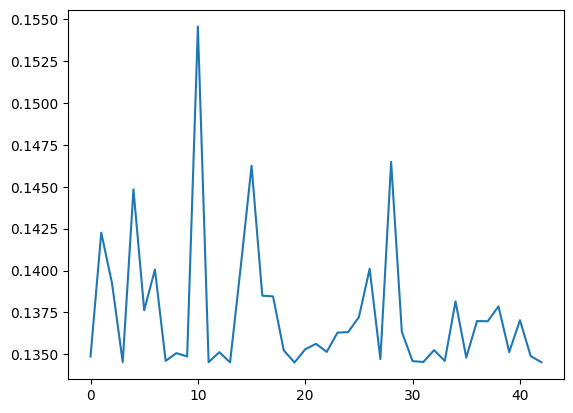

In [200]:
## Plotting model loss toward n_epoch
plt.plot([x for x in range(len(model_FM.history_))], model_FM.history_,)

In [201]:
## -- Find the lowest loss (global optimum) in n-epoch -- ##
loss_history = {idx: data for idx, data in enumerate(model_FM.history_)}

min_index = min(loss_history, key=loss_history.get)
min_value = loss_history[min_index]

print(f"the lowest loss is in epoch: {min_index} with loss: {min_value}")

the lowest loss is in epoch: 19 with loss: 0.1345154144347597


In [205]:
## -- Retain RMSE Score of model -- ##
from sklearn.metrics import mean_squared_error

y_pred = model_FM.predict(X_train_sparse)
np.sqrt(mean_squared_error(y_train, y_pred))

5.6408715990869815

### <a id='toc1_4_2_'></a>[Train Recommendation System](#toc0_)
-----

### <a id='toc1_4_2_1_'></a>[Baseline Model](#toc0_)

In [217]:
from sklearn.dummy import DummyRegressor
from sklearn.metrics import mean_squared_error

## -- Create baseline model from dummyregressor to predict based on data mean -- ##
model_baseline = DummyRegressor()

In [218]:
## -- Fitting baseline model to dataset -- ##
model_baseline.fit(X_train_sparse,y_train)

DummyRegressor()

In [219]:
# Calculate Score (MSE) from baseline model
baseline_pred = model_baseline.predict(X_train)

baseline_mse = mean_squared_error(y_train,baseline_pred)

# print result
print('MSE for baseline_model : ',baseline_mse)

MSE for baseline_model :  0.9641544243750001


### <a id='toc1_4_2_2_'></a>[Hyperparameter Tuning FM Regressor SGD](#toc0_)

In [220]:
#create dictionary of hyperparameter
params_fm = {'n_epoch' : np.arange(1,150,1),
              'lr' : [1,0.1,0.01,0.001,0.0001], 'n_factors' : [50,100,200,250,300],
              'lambda_factor' : [1,0.1,0.01,0.02], 'lambda_coef' : [1,0.1,0.01,0.02]
              }

In [221]:
# instanciate model
model_fm = FMRegressor()

In [222]:
# run randomizedsearch to find best parameter
# from skopt import BayesSearchCV
from sklearn.model_selection import RandomizedSearchCV

In [223]:
# instanciate model selection
cv_fm = RandomizedSearchCV(estimator=model_fm,
                            param_distributions=params_fm,
                            scoring = 'neg_root_mean_squared_error',
                            cv = 5)

In [224]:
# fit hyperparameter tuning
cv_fm.fit(X_train_sparse,y_train)

100%|██████████| 1/1 [00:00<00:00, 67.74it/s]


RandomizedSearchCV(cv=5, estimator=FMRegressor(),
                   param_distributions={'lambda_coef': [1, 0.1, 0.01, 0.02],
                                        'lambda_factor': [1, 0.1, 0.01, 0.02],
                                        'lr': [1, 0.1, 0.01, 0.001, 0.0001],
                                        'n_epoch': array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59...
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149]),
                                        'n_factors': [50, 100, 200, 250, 300]},
                   scoring='neg_root_mean_squared_error')

In [225]:
## -- Return best parameter -- ##
cv_fm.best_params_

{'n_factors': 250,
 'n_epoch': 1,
 'lr': 1,
 'lambda_factor': 1,
 'lambda_coef': 0.01}

In [226]:
## -- Return best score based on best parameter above -- ##
-1 * cv_fm.best_score_

4.652464456207136

-------------------

## <a id='toc1_4_2_3_'></a>[**2. FM Regressor Monte Carlo Markov Chain**](#toc0_)

### Encoded Dataset

In [227]:
## -- Initialize Dictvectorizer to perform encoding sparse matrix -- ##
from sklearn.feature_extraction import DictVectorizer

v = DictVectorizer()

In [231]:
## --Create new dataset based on mapped data --##
mapped_fm = mapped_data[['user_id','app_id','price_range','new_rating']] # Only contains price_range as context-aware

mapped_fm.shape

(999964, 4)

In [232]:
## Convert user IDs and game IDs dtypes into str
mapped_fm.user_id = mapped_fm.user_id.astype('str')
mapped_fm.app_id = mapped_fm.app_id.astype('str')

### Split train test dataset

In [233]:
## -- Split predictor feature and label feature using train test split -- ##
from sklearn.model_selection import train_test_split
X_fm = mapped_fm.drop('new_rating', axis=1)
y_fm = mapped_fm['new_rating']

# Split the data
X_train_fm, X_test_fm, y_train_fm, y_test_fm = train_test_split(X_fm, y_fm, test_size=0.2)

### Preprocessing predictor and label dataset

In [234]:
## -- Return data as dictionary type -- ##
X_fm = X_train_fm.to_dict(orient='records')

## -- Preprocess predictor feature into encoded sparse matrix -- ##
X_fm = v.fit_transform(X_fm)

## -- Retain label train into array -- ##
y_fm = np.asarray(y_train_fm.values)

## -- Preprocess predictor of test data into encoded sparse matrix -- ##
X_test_fm = v.transform(X_test_fm.to_dict(orient='records'))

### FM MCMC Model Fitting

In [235]:
## -- Initialize Factorization Machine Model -- ##
fm_regression = MyFMRegressor(rank=2)

In [236]:
## -- Fitting factorization machine model into train dataset -- ##
fm_regression.fit(X_fm, y_fm, n_iter=100)

  0%|          | 0/100 [00:00<?, ?it/s]

alpha = 5103.81 w0 = 7.88 : 100%|██████████| 100/100 [00:53<00:00,  1.88it/s]


In [241]:
## -- Perform Checking to 1 row to predict rating -- ##
mapped_fm[['user_id','app_id','price_range','new_rating']].to_dict(orient='records')[605]

{'user_id': '605', 'app_id': '0', 'price_range': 'medium', 'new_rating': 9}

In [243]:
## -- Predict rating of sample data -- ##
fm_regression.predict(v.transform([{'user_id': '1000','app_id': '0', 'price_range': 'luxury', 'year_range': 'new'}]))

array([8.73875254])

### FM MCMC Model performance

In [244]:
## -- Predict Test data -- ##
y_pred_fm = fm_regression.predict(X_test_fm)

In [245]:
from sklearn.metrics import mean_squared_error

## -- Evaluate RMSE model performance on test dataset -- ##
fm_mcmc_score = mean_squared_error(y_true=y_test_fm, y_pred=y_pred_fm, squared=False)

print(fm_mcmc_score)

0.14617891579318026


### Get Top-N Recommendation of FM Monte Carlo Markov Chain Model

In [275]:
## -- Get user IDs and game IDs mapping -- ##
mapping_user = {'user_to_id' : user_to_id,'id_to_user' : id_to_user}
mapping_item = {'item_to_id' : app_to_id,'id_to_item' : id_to_app}

In [276]:
## -- Get unique movieId -- #
unique_game_id = set(games_data['app_id'].unique())

In [277]:
import random
import datetime

## -- Create top-N recommendation -- ##
def recommend_fm_to_users(user_id, N=10, games_data=games_data,
                       mapping_item = mapping_item, price_range='medium') :
    # collect user id
    userID = str(mapping_user['user_to_id'][user_id])

    # Get gameIDs that is rated by user id
    rated_game_id = set(FM_data.loc[FM_data['user_id']==user_id, 'app_id'])
    
    # Get gameIDs that is not rated yet by user id
    unrated_game_id = unique_game_id.difference(rated_game_id)
    unrated_game_id = list(unrated_game_id)

    # create dataframe first
    recommended_game_df = pd.DataFrame()

    print('convert app_id to capable read by models.  ', datetime.datetime.now())

    # Store unrated game IDs into dataframe and convert into listed index
    recommended_game_df['itemID'] = unrated_game_id
    recommended_game_df['itemID'] = recommended_game_df['itemID'].map(mapping_item['item_to_id'])

    # Drop any missing values in dataframe
    recommended_game_df = recommended_game_df.dropna(axis=0)

    # Convert Game IDs dtypes into str to merge with game title afterward
    recommended_game_df['itemID'] = recommended_game_df['itemID'].astype('int')
    recommended_game_df['itemID'] = recommended_game_df['itemID'].astype('str')

    print(recommended_game_df.itemID.values[:4])

    # Initialize an empty list to store the dictionaries
    dictionaries = []

    # Initialize a set to keep track of used 'app_id' values
    used_app_ids = set()

    # Generate 100 dictionaries with unique 'app_id' values
    while len(dictionaries) < len(recommended_game_df['itemID'].values):
        # Choose a random 'app_id' from the list
        app_id = random.choice(recommended_game_df['itemID'].values)
        
        # Check if the 'app_id' has already been used
        if app_id not in used_app_ids:
            price_range = price_range  # You can set other values as needed

            # Create the dictionary
            data = {'user_id': userID, 'app_id': app_id, 'price_range': price_range}

            # Append it to the list
            dictionaries.append(data)
            
            # Add the 'app_id' to the set of used values
            used_app_ids.add(app_id)

    print('generate list of prediction dictionaries.')

    # create dataframe first
    recommended_game_df = pd.DataFrame()

    # Create an empty list to store recommended game ratings, IDs, and price
    recommended_ratings = []
    recommended_gamesID = []
    recommended_UserID = []
    recommended_price = []

    print('generate rating for each unrated games IDs.  ', datetime.datetime.now())

    for i, entry in enumerate(dictionaries, start=1):
    
        # Get recommendation games
        recommended_game_rating = fm_regression.predict(v.transform([entry]))

        # Append the result to the list
        recommended_ratings.append(recommended_game_rating[0])
        recommended_gamesID.append(entry['app_id'])
        recommended_UserID.append(entry['user_id'])
        recommended_price.append(entry['price_range'])

    print('generate dataframe of rated game IDs.  ', datetime.datetime.now())

    # Create new column in the dataframe to store the result
    recommended_game_df['gamesID'] = recommended_gamesID
    recommended_game_df['gamesID'] = recommended_game_df['gamesID'].astype('int')
    recommended_game_df['userID'] = recommended_UserID
    recommended_game_df['userID'] = recommended_game_df['userID'].map(mapping_user['id_to_user'])

    # Remapping back app_id to true value of app_id
    recommended_game_df['gamesID'] = recommended_game_df['gamesID'].map(mapping_item['id_to_item'])

    # Create a new column in the DataFrame with the recommended ratings
    recommended_game_df['ratings'] = recommended_ratings


    print('generate recommendation title games.  ', datetime.datetime.now())
    recommended_game_df = recommended_game_df.merge(games_data[['app_id', 'title', 'popular_tags', 'price_final','price_range']],
                                                    left_on='gamesID', right_on='app_id').drop_duplicates()
    
    # recommended_game_df = recommended_game_df.loc[recommended_game_df.price_range==price_range]
    
    # recommended_game_df = recommended_game_df.sort_values(by='ratings', ascending=False).head(N)


    return recommended_game_df

In [279]:
## -- Predict all rating toward unrated Game IDs of User IDs 3924036 -- ##
recommend_games = recommend_fm_to_users(user_id='3924036', N=10, price_range='medium')

convert app_id to capable read by models.   2023-09-17 21:55:45.144234
['1011' '10860' '2173' '84']
generate list of prediction dictionaries.
generate rating for each unrated games IDs.   2023-09-17 21:55:45.645978
generate dataframe of rated game IDs.   2023-09-17 22:31:37.442923
generate recommendation title games.   2023-09-17 22:31:37.471567


In [286]:
## -- Get top-N history rating given game of User IDs 3924036 -- ##
FM_data.loc[FM_data.user_id=='3924036'][['user_id','title','popular_tags','price_final','new_rating','price_range']].head(10)

,user_id,title,popular_tags,price_final,new_rating,price_range
89217,3924036,Far Cry® 5,"Open World,FPS,Action,Co-op,Multiplayer,Shoote...",59.99,8,overpriced
166031,3924036,Middle-earth™: Shadow of War™,"Open World,Action,RPG,Fantasy,Singleplayer,Adv...",49.99,8,luxury
398460,3924036,The Witcher: Enhanced Edition Director's Cut,"RPG,Fantasy,Story Rich,Mature,Singleplayer,Cho...",9.99,8,medium
497661,3924036,Crossout,"Free to Play,Action,Multiplayer,Crafting,Build...",0.00,7,cheap
588742,3924036,Resident Evil 6,NaN,29.99,8,expensive
748416,3924036,Hand of Fate,"Card Game,RPG,Singleplayer,Action,Rogue-like,F...",19.99,8,medium
840881,3924036,Tales of Vesperia: Definitive Edition,"JRPG,RPG,Anime,Singleplayer,Story Rich,Action ...",49.99,8,luxury
870916,3924036,Resident Evil 5,NaN,19.99,8,medium
898135,3924036,Ashes of the Singularity: Escalation,"Strategy,RTS,Sci-fi,Multiplayer,Singleplayer,S...",29.99,7,expensive
931382,3924036,Braveland,"Strategy,RPG,Indie,Turn-Based Strategy,Casual,...",7.99,8,medium


In [298]:
## Recommend game based on its price range
## Determined price range above is should be same with here, to get best prediction of rating given by User IDs of specific price range
recommended_game_df = recommend_games.loc[recommend_games.price_range=='overpriced']
    
recommended_game_df = recommended_game_df.sort_values(by='ratings', ascending=False).head(10)

## Return top-N games based on predicted rating given by User IDs 3924036 ## 
recommended_game_df

,ratings,gamesID,userID,app_id,title,popular_tags,price_final,price_range
97358,9.102218,814380,88514,814380,Sekiro™: Shadows Die Twice - GOTY Edition,NaN,59.99,overpriced
401074,8.280391,831560,88514,831560,WARRIORS OROCHI 4,NaN,59.99,overpriced
415171,8.271005,392470,88514,392470,NOBUNAGA'S AMBITION: Sphere of Influence,"Strategy,Historical,Grand Strategy,Singleplaye...",59.99,overpriced
920628,8.139241,21090,88514,21090,F.E.A.R.,"Horror,FPS,Action,Bullet Time,Classic,Singlepl...",54.99,overpriced
643054,8.125011,363890,88514,363890,RPG Maker MV,"RPGMaker,Game Development,RPG,Anime,Design & I...",79.99,overpriced
489917,8.107542,502280,88514,502280,BERSERK and the Band of the Hawk,"Anime,Hack and Slash,Action,Sexual Content,Vio...",59.99,overpriced
826447,8.098061,678950,88514,678950,DRAGON BALL FighterZ,"Fighting,Anime,2D Fighter,Multiplayer,Action,C...",59.99,overpriced
561406,8.074791,502500,88514,502500,ACE COMBAT™ 7: SKIES UNKNOWN,"Flight,Action,Great Soundtrack,Story Rich,Arca...",59.99,overpriced
36581,8.070484,312660,88514,312660,Sniper Elite 4,"Sniper,Shooter,World War II,Stealth,Multiplaye...",59.99,overpriced
677755,8.064205,374320,88514,374320,DARK SOULS™ III,"Dark Fantasy,Difficult,RPG,Atmospheric,Lore-Ri...",59.99,overpriced


### Add Release Date range context to model

In [250]:
## -- Add relased date context into model -- ##
X_mapped_data_fm = mapped_data[['user_id','app_id','price_range','year_range','new_rating']]

## -- Split dataset -- ##
X_train_fm, X_test_fm = train_test_split(X_mapped_data_fm, test_size=0.2, random_state=42)

In [254]:
## -- Create new function to predict rating based on price range and release date range -- ##
def test_myfm(df_train, df_test, rank=2, grouping=None, n_iter=100, samples=95):
    explanation_columns = ["user_id", "app_id", "price_range",'year_range']
    ohe = OneHotEncoder(handle_unknown="ignore")
    X_train = ohe.fit_transform(df_train[explanation_columns])
    X_test = ohe.transform(df_test[explanation_columns])
    y_train = df_train.new_rating.values
    y_test = df_test.new_rating.values
    fm = MyFMRegressor(rank=rank, random_seed=114514)

    if grouping:
        # specify how columns of X_train are grouped
        group_shapes = [len(category) for category in ohe.categories_]
        assert sum(group_shapes) == X_train.shape[1]
    else:
        group_shapes = None

    fm.fit(
        X_train,
        y_train,
        group_shapes=group_shapes,
        n_iter=n_iter,
        n_kept_samples=samples,
    )
    prediction = fm.predict(X_test)
    rmse = ((y_test - prediction) ** 2).mean() ** 0.5
    mae = np.abs(y_test - prediction).mean()
    print("rmse={rmse}, mae={mae}".format(rmse=rmse, mae=mae))
    return fm, rmse

In [274]:
## -- Test model performance -- ##
fm_regression_2, rmse_fm_2 = test_myfm(X_train_fm, X_test_fm, rank=8, n_iter=200)

alpha = 2848.73 w0 = 7.86 : 100%|██████████| 100/100 [02:02<00:00,  1.23s/it]


rmse=0.14193097328867502, mae=0.04088819703235609


### <a id='toc1_4_3_'></a>[Best Model Comparison](#toc0_)

In [272]:
summary_model = summary_df.copy()

model_to_append = [
    {'Model':'Factorization Machine SGD', 'CV Performance - RMSE': -1 * cv_fm.best_score_, 'Model Condiguration': cv_fm.best_params_},
    {'Model':'Factorization Machine MCMC', 'CV Performance - RMSE': fm_mcmc_score, 'Model Condiguration': "{'rank':2}"},
    {'Model':'Factorization Machine MCMC + Released Date', 'CV Performance - RMSE': rmse_fm_2, 'Model Condiguration': "{'rank':8,'n_iter':100}"}
]

summary_model = summary_model.append(model_to_append, ignore_index=True)

In [273]:
summary_model

,Model,CV Performance - RMSE,Model Condiguration
0,Baseline,0.980178,N/A
1,Item-to-Item Neighborhood CF,0.691158,"{'k': 15, 'sim_options': {'name': 'cosine', 'u..."
2,User-to-User Neighborhood CF,0.693242,"{'k': 5, 'sim_options': {'name': 'pearson_base..."
3,Factorization Machine SGD,4.652464,"{'n_factors': 250, 'n_epoch': 1, 'lr': 1, 'lam..."
4,Factorization Machine MCMC,0.146179,{'rank':2}
5,Factorization Machine MCMC + Released Date,0.136848,"{'rank':8,'n_iter':100}"


## **3. FM Monte Carlo Markov Chain Classification**

In [300]:
## -- Initialize DictVectorizer -- ##
from sklearn.feature_extraction import DictVectorizer

v = DictVectorizer()

In [301]:
## -- Retain new dataset with is_recommended feature as label that want to predict -- ##
mapped_fm_class = mapped_data[['user_id','app_id','price_range','is_recommended']]

In [302]:
## -- Convert User IDs and Game IDs dtypes -- ##
mapped_fm_class.user_id = mapped_fm_class.user_id.astype('str')
mapped_fm_class.app_id = mapped_fm_class.app_id.astype('str')

In [303]:
## -- Splitting dataset of predictor and label feature -- ##
from sklearn.model_selection import train_test_split
X_fm_class = mapped_fm_class.drop('is_recommended', axis=1)
y_fm_class = mapped_fm_class['is_recommended']

# Split the data
X_train_fm_class, X_test_fm_class, y_train_fm_class, y_test_fm_class = train_test_split(X_fm_class, y_fm_class, test_size=0.2)

In [304]:
## -- Preprocessing predictor and label features into encoded sparse matrix -- ##
X_fm_class = X_train_fm_class.to_dict(orient='records')

X_fm_class = v.fit_transform(X_fm_class)

y_fm_class = np.asarray(y_train_fm_class.values)

X_test_fm_class = v.transform(X_test_fm_class.to_dict(orient='records'))

In [312]:
## -- Intialize model FM Classifier -- ##
fm_classification = MyFMClassifier(rank=8)

In [313]:
## -- Fitting model toward dataset -- ##
fm_classification.fit(X_fm_class, y_fm_class, n_iter=200)

  0%|          | 0/200 [00:00<?, ?it/s]

w0 = 1.18 : 100%|██████████| 200/200 [05:28<00:00,  1.64s/it]


In [314]:
## -- Predict class of dataset -- ##
y_pred_fm_class = fm_classification.predict(X_test_fm_class)

In [315]:
## -- Mapping predicted class of True, False into binary value -- ##
def mapping(x):
    if x==True:
        return 1
    else:
        return 0
    
y_pred_fm_class = np.array(list(map(mapping, y_pred_fm_class)))

In [316]:
## -- evaluate model performance in predict is_recommended feature of dataset -- ##
from sklearn.metrics import f1_score

## -- evaluate based on F1-Score since we do not focus either in return all the recommendation item (precision) 
## or return the recommendation only in prediction (recall),
## Hence we all used F1-Score to all rounded score 
 
fm_mcmc_class_score = f1_score(y_true=y_test_fm_class, y_pred=y_pred_fm_class)

print(fm_mcmc_class_score)

0.929208008552197


In [317]:
pd.DataFrame({'Model':['Factorization Machine Classification MCMC'],
              'Accuracy Score':[fm_mcmc_class_score],
              'Model Configuration':["{'rank':2,'n_iter':200}"]})

,Model,Accuracy Score,Model Configuration
0,Factorization Machine Classification MCMC,0.929208,"{'rank':2,'n_iter':200}"


## <a id='toc1_5_'></a>[**4. Implicit Feedback: Bayesian Personalized Ranking**](#toc0_)

### 1. Retain dataset for BPR

In [318]:
implicit_data = FM_data[['user_id','app_id','hours','price_range','year_range']]

In [319]:
## -- Mapping user IDs and game IDs index -- ##
implicit_data.user_id = implicit_data.user_id.map(user_to_id)
implicit_data.app_id = implicit_data.app_id.map(app_to_id)

## -- Mapping data -- ##
mapping_user = {'user_to_id' : user_to_id,'id_to_user' : id_to_user}
mapping_item = {'item_to_id' : app_to_id,'id_to_item' : id_to_app}

### 2. Preprocessing BPR data

In [320]:
## -- Preprocess implicit data into sparse matrix -- ##
def preprocess_implicit_data(data,feature):
    row = data.user_id.values
    col = data.app_id.values
    value = data[feature].values

    utility_matrix = sp.coo_matrix((value, (row, col)))

    return utility_matrix

In [321]:
## -- preprocess data -- ##
implicit_hour = preprocess_implicit_data(implicit_data, 'hours')

In [322]:
implicit_hour

<864092x12412 sparse matrix of type '<class 'numpy.float64'>'
	with 1000000 stored elements in COOrdinate format>

### 3. Split train and test data

In [323]:
from implicit.evaluation import train_test_split

# split data into train and test
train_full,test = train_test_split(implicit_hour,train_percentage=0.8)

In [324]:
# set train_full to coo_again to perform splitting for validation data
train,val = train_test_split(implicit_hour,train_percentage=0.75)

In [325]:
print('train shape',train.nnz)
print('val shape',val.nnz)
print('test shape',test.nnz)

train shape 750027
val shape 249918
test shape 200487


### <a id='toc1_5_1_1_'></a>[4. Alternating Least Squares Model](#toc0_)

In [326]:
import optuna

# import model alternating least squares
from implicit import als
from implicit.evaluation import ndcg_at_k

def als_tuning(trial):
    factors = trial.suggest_int(name='factors',
                                             low=10,
                                             high=100,step=10)
    regularization = trial.suggest_float(name='regularization',
                                         low=0.0001,
                                         high=1.0,
                                         step= 0.001)

    alpha = trial.suggest_float(name='alpha',
                                      low=0.001,
                                      high=1.0,
                                      step= 0.001)

    # instanciate model
    model_als = als.AlternatingLeastSquares(factors=factors,
                                            regularization= regularization,
                                            alpha= alpha)

    # fit model
    model_als.fit(train)

    # test
    val_metrics = ndcg_at_k(model = model_als, train_user_items= train,
                                  test_user_items = val,K=5)
    return -val_metrics

# minimizing is equal to
study_als = optuna.create_study(direction="minimize")
study_als.optimize(als_tuning, n_trials=2)

[I 2023-09-18 00:38:37,373] A new study created in memory with name: no-name-94fc9694-9f96-4f1c-a100-ea827479035e


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/237306 [00:00<?, ?it/s]

[I 2023-09-18 00:41:53,634] Trial 0 finished with value: -0.005667460695088532 and parameters: {'factors': 40, 'regularization': 0.8611, 'alpha': 0.777}. Best is trial 0 with value: -0.005667460695088532.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/237306 [00:00<?, ?it/s]

[I 2023-09-18 00:46:10,948] Trial 1 finished with value: -0.005683334030546522 and parameters: {'factors': 70, 'regularization': 0.7541, 'alpha': 0.372}. Best is trial 1 with value: -0.005683334030546522.


In [327]:
## -- Return Alternating Least Square best score -- ##
study_als.best_value

-0.005683334030546522

### <a id='toc1_5_1_2_'></a>[**5. Bayesian Personalized Ranking**](#toc0_)

In [354]:
from implicit import bpr

## Create BPR parameter tuning model ##
def bpr_tuning(trial):
    factors = trial.suggest_int(name='factors',
                                             low=10,
                                             high=500,step=10)

    regularization = trial.suggest_float(name='regularization',
                                         low=0.0001,
                                         high=1.0,
                                         step= 0.001)

    learning_rate = trial.suggest_float(name='alpha',
                                      low=0.001,
                                      high=1.0,
                                      step= 0.001)

    # instanciate model
    bpr_model = bpr.BayesianPersonalizedRanking(factors=factors,
                                                regularization=regularization,
                                                learning_rate=learning_rate)



    # fit model
    bpr_model.fit(train)

    # test
    val_metrics = ndcg_at_k(model = bpr_model, train_user_items= train,
                                  test_user_items = val,K=5)
    return -val_metrics

## -- perform hyperparam tuning on BPR model -- ##
study_bpr = optuna.create_study(direction="minimize")
study_bpr.optimize(bpr_tuning, n_trials=2)

[I 2023-09-18 01:10:04,966] A new study created in memory with name: no-name-3b4cad6b-1429-45b3-bf12-70b38e1f4f27


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/237306 [00:00<?, ?it/s]

[I 2023-09-18 01:10:29,668] Trial 0 finished with value: -0.00037714296898604176 and parameters: {'factors': 80, 'regularization': 0.3761, 'alpha': 0.214}. Best is trial 0 with value: -0.00037714296898604176.


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/237306 [00:00<?, ?it/s]

[I 2023-09-18 01:10:56,775] Trial 1 finished with value: -3.521994600041219e-05 and parameters: {'factors': 110, 'regularization': 0.7671, 'alpha': 0.898}. Best is trial 0 with value: -0.00037714296898604176.


In [355]:
## -- Return BPR best score -- ##
-study_bpr.best_value

0.00037714296898604176

In [356]:
## -- Create model summary performance -- ##
summary_df = pd.DataFrame({'Model': ['Alternating Least Squares', 'Bayesian Personalized Ranking',],
                           'CV Performance - NDCG @5': [-1*study_als.best_value,-1*study_bpr.best_value],
                           'Model Condiguration':[f'{study_als.best_params}',f'{study_bpr.best_params}']})

summary_df

,Model,CV Performance - NDCG @5,Model Condiguration
0,Alternating Least Squares,0.005683,"{'factors': 70, 'regularization': 0.7541, 'alp..."
1,Bayesian Personalized Ranking,0.000377,"{'factors': 80, 'regularization': 0.3761, 'alp..."


In [342]:
## -- Return BPR best parameter -- ##
study_als.best_params

{'factors': 70, 'regularization': 0.7541, 'alpha': 0.372}

In [343]:
# Create object
best_params_bpr = {'factors':study_bpr.best_params['factors'],
                   'regularization':study_bpr.best_params['regularization']}

# Create object
best_params_als = {'factors':study_als.best_params['factors'],
                   'regularization':study_als.best_params['regularization']}

model_best = als.AlternatingLeastSquares(**best_params_als)

# Retrain on whole train dataset
model_best.fit(train_full)

  0%|          | 0/15 [00:00<?, ?it/s]

In [344]:
## -- Return ndcg score of model toward test dataset -- ##
test_score = ndcg_at_k(model = model_best, train_user_items= train_full,
                                  test_user_items = test,K=5)

  0%|          | 0/192005 [00:00<?, ?it/s]

In [350]:
## -- Show BPR model evaluation -- ##
summary_test_df = pd.DataFrame({'Model' : ['Alternating Least Square'],
                                'NDCG@5-Tuning': [-study_als.best_value],
                                'NDCG@5': [test_score]})

summary_test_df

,Model,NDCG@5-Tuning,NDCG@5
0,Alternating Least Square,0.005683,0.005581


### <a id='toc1_5_1_3_'></a>[6. Top-N BPR Recommendation](#toc0_)

In [346]:
## Try model recommend item function ##
model_best.recommend(userid= 903, user_items= train_full[903], N=10 )

(array([ 250,  628,  923,   95,  403,  436,   38,  800, 1287,   16]),
 array([0.2689247 , 0.26176086, 0.20974332, 0.20287816, 0.18306649,
        0.16451372, 0.15818524, 0.15704374, 0.15353668, 0.15211807],
       dtype=float32))

In [347]:
## -- Create function to return top-N recommendation games using BPR Models toward certain User IDs -- ##
def recommend_to_users(user_id, user_items=train_full, N=10, games_data=games_data,
                       mapping_item = mapping_item) :
    # collect user id
    userID = [mapping_user['user_to_id'][f'{user_id}'] ] * N
    
    # Get recommendation games
    recommended_game_id,_ = model_best.recommend(userid= userID, user_items= user_items[userID], N=N )

    # create dataframe first
    recommended_game_df = pd.DataFrame()
    recommended_game_df['gamesID'] = recommended_game_id[0]
    recommended_game_df['userID'] = userID
    recommended_game_df['gamesID'] = recommended_game_df['gamesID'].map(mapping_item['id_to_item'])

    recommended_game_df = recommended_game_df.merge(games_data[['app_id', 'title', 'popular_tags', 'price_final']],
                                                    left_on='gamesID', right_on='app_id').drop_duplicates()


    return recommended_game_df

In [348]:
## -- Find specific User IDs that we want to predict top-N recommendation games -- ##
games_data.loc[games_data.user_id == '3924036'].head(2)

,app_id,review_date,is_recommended,hours,user_id,title,rating,price_final,appid,developer,publisher,categories,genres,release_date,popular_tags,game_details,game_description,year,interactions_count,novelty_score,new_rating,unexpectedness_score,popularity_score,serependity_score,price_range,year_range
89217,552520,2020-07-21,1,18.2,3924036,Far Cry® 5,Very Positive,59.99,552520,Ubisoft Montreal;Red Storm;Ubisoft Shanghai;Ub...,Ubisoft,Single-player;Multi-player;Co-op;Steam Trading...,Action;Adventure,2018-03-26,"Open World,FPS,Action,Co-op,Multiplayer,Shoote...","Single-player,Multi-player,Co-op,Steam Trading...",About This Game Far Cry comes to America in t...,1.769863,3043,0.996478,8,9325,2.967818,0.370977,overpriced,new
166031,356190,2019-01-07,1,21.8,3924036,Middle-earth™: Shadow of War™,Very Positive,49.99,356190,Monolith Productions,WB Games,Single-player;Steam Achievements;Full controll...,Action;Adventure;RPG,2017-10-09,"Open World,Action,RPG,Fantasy,Singleplayer,Adv...","Single-player,Steam Achievements,Full controll...",About This Game Go behind enemy lines to forg...,2.230137,1575,0.998177,8,10793,2.018194,0.252274,luxury,new


In [349]:
## -- return top-N recommendation games to User IDs 6930809 -- ##
recommend_games = recommend_to_users(user_id=3924036, 
                   user_items=train_full, 
                   N=10, 
                   games_data=games_data, 
                   mapping_item=mapping_item)

recommend_games

,gamesID,userID,app_id,title,popular_tags,price_final
0,12210,88514,12210,Grand Theft Auto IV: The Complete Edition,NaN,19.99
3207,379430,88514,379430,Kingdom Come: Deliverance,"Medieval,RPG,Open World,Realistic,Singleplayer...",29.99
4507,372000,88514,372000,Tree of Savior (English Ver.),"MMORPG,Massively Multiplayer,Free to Play,RPG,...",0.00
4924,418460,88514,418460,Rising Storm 2: Vietnam,"FPS,War,Realistic,Multiplayer,Military,Shooter...",24.99
6576,200260,88514,200260,Batman: Arkham City - Game of the Year Edition,"Action,Batman,Open World,Stealth,Adventure,Thi...",19.99
8413,883710,88514,883710,Resident Evil 2,NaN,39.99
10483,219640,88514,219640,Chivalry: Medieval Warfare,"Medieval,Multiplayer,Action,Gore,First-Person,...",24.99
11669,431240,88514,431240,Golf With Your Friends,"Early Access,Multiplayer,Mini Golf,Golf,Early ...",4.94
13537,291650,88514,291650,Pillars of Eternity,"RPG,Fantasy,Isometric,Story Rich,Singleplayer,...",29.99
14152,637650,88514,637650,FINAL FANTASY XV WINDOWS EDITION,"RPG,Open World,JRPG,Fantasy,Story Rich,Great S...",34.99
